In [3]:
cd ..

m:\OneDrive\Projects\federated_imputation_pc2


# Test SciencePlot Library

In [66]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
import pandas as pd
import seaborn as sns
import json

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots

import os

# Check we are in examples dir
current_dir = os.getcwd().lower()
if (current_dir.endswith('scienceplots')):
    os.chdir('./examples')
# Create 'figures' folder if it does not exist
if (not os.path.exists('./figures')):
    os.makedirs('figures')

def model(x, p):
    return x ** (2 * p + 1) / (1 + x ** (2 * p))

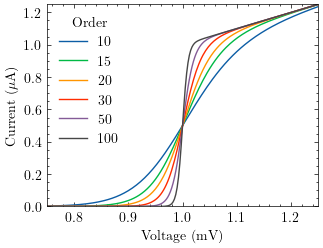

In [6]:
pparam = dict(xlabel='Voltage (mV)', ylabel=r'Current ($\mu$A)')

x = np.linspace(0.75, 1.25, 201)

with plt.style.context(['science']):
    fig, ax = plt.subplots()
    for p in [10, 15, 20, 30, 50, 100]:
        ax.plot(x, model(x, p), label=p)
    ax.legend(title='Order')
    ax.autoscale(tight=True)
    ax.set(**pparam)
    #fig.savefig('figures/fig01.jpg', dpi=300)
    #plt.close()
    plt.show()

# Line Charts Comparison Different Scenarios

In [272]:
plt.rcParams['text.usetex'] = True
marker_size = 6
lw1 = '2'
ls1 = '-'
# plot params
style_dict = {
    "central": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": '#1f77b4',
        "marker": "+",
        'label': r'\textbf{Central}'
    }, 
    "local": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": '#ff7f0e',
        "marker": "^",
        "label": r'\textbf{Local}'
    },
    "simpleavg": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": '#2ca02c',
        "marker": "s",
        "label": r'\textbf{Savg}'
    },
    "fedmechw_new": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "#AE2012", #'#d62728'
        "marker": "x",
        "label": r"\textbf{Cafe}"
    },
}

label_size = 14

def draw_linechart(data, x_values, x_label, metrics, metrics2, output_name, legend = True):
    ms = 3
    fig, axes = plt.subplots(2, 2, figsize=(6, 4.5))
    for idx, metric in enumerate(metrics):
        row_idx, col_idx = idx // 2, idx % 2
        print(row_idx, col_idx)
        for method in data['method'].unique():
            axes[row_idx, col_idx].plot(
                x_values, data[data['method'] == method][metrics[idx]], 
                label=style_dict[method]['label'], 
                c = style_dict[method]['color'],
                marker=style_dict[method]['marker'], 
                markersize=marker_size,
                linestyle = style_dict[method]['line_style'], 
                linewidth = style_dict[method]['line_width'],
                fillstyle='none',
            )
           
        if idx <=1:
            for method in data['method'].unique():
                for i in range(2):
                    if i == 0: ls2 = 'c_line_style'
                    else: ls2 = 'p_line_style'
                    axes[row_idx, col_idx].plot(
                        x_values, data[data['method'] == method][metrics2[idx*2 + i]], 
                        label=style_dict[method]['label'], 
                        c = style_dict[method]['color'],
                        marker=style_dict[method]['marker'], 
                        markersize=marker_size,
                        linestyle = style_dict[method][ls2], 
                        linewidth = style_dict[method]['line_width2'],
                        fillstyle='none'
                    )
        
        if metric == 'rmse':
            # axes[row_idx, col_idx].set_ylim([0.05, 0.3])
            # axes[row_idx, col_idx].set_yticks([0.1, 0.25])
            axes[row_idx, col_idx].get_yaxis().set_label_coords(-0.13,1.2)
        elif metric == 'sliced-ws':
            # axes[row_idx, col_idx].set_ylim([0.0, 0.17])
            # axes[row_idx, col_idx].set_yticks([0.05, 0.15])
            axes[row_idx, col_idx].get_yaxis().set_label_coords(-0.17,1.2)
        elif metric == 'accu':
            # axes[row_idx, col_idx].set_ylim([45, 90])
            # axes[row_idx, col_idx].set_yticks([50, 65, 80])
            axes[row_idx, col_idx].get_yaxis().set_label_coords(-0.13,0.6)
        elif metric == 'f1':
            # axes[row_idx, col_idx].set_ylim([25, 80])
            # axes[row_idx, col_idx].set_yticks([40, 60, 80])
            axes[row_idx, col_idx].get_yaxis().set_label_coords(-0.17,0.6)
        
        
        if row_idx == 1:
            axes[row_idx, col_idx].set_xlabel(r"$N$", fontname="Computer Modern Serif", fontsize = label_size)
            
        axes[row_idx, col_idx].set_xticks(x_values)
        axes[row_idx, col_idx].set_ylabel(metrics[idx].upper(), fontname="Computer Modern Serif", fontsize = label_size)
        axes[row_idx, col_idx].spines['top'].set_visible(False)
        axes[row_idx, col_idx].spines['right'].set_visible(False)
        axes[row_idx, col_idx].yaxis.set_ticks_position('left')
        axes[row_idx, col_idx].xaxis.set_ticks_position('bottom')
    
    plt.subplots_adjust(wspace=0.27, hspace=0.2)
    if legend:
        plt.legend(bbox_to_anchor=(-1.15,2.4), loc='upper left', ncol=4, frameon = False, prop = { "size": 10, 'weight': 'bold'})
    fig.savefig(f'figures/{output_name}.png', dpi=600, bbox_inches="tight")
    #plt.close()
    plt.show()

0 0
0 1
1 0
1 1


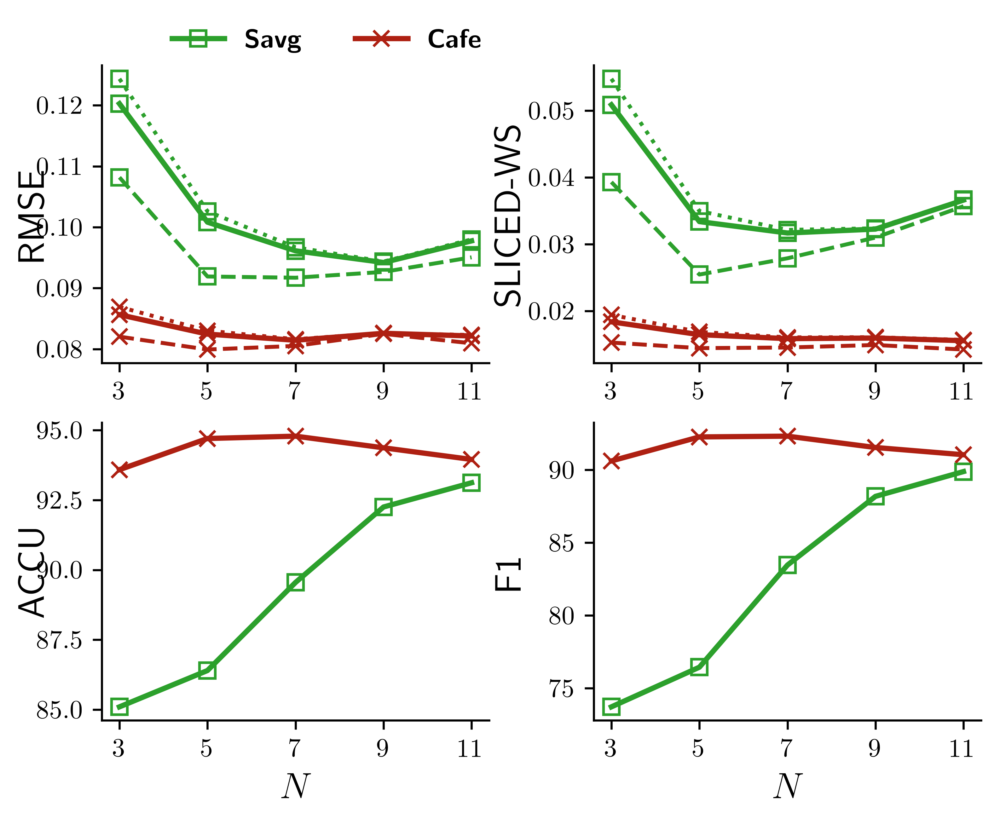

In [287]:
# scenario 1 - N = 1,3,5,7,9,11 vs Prediction AUROC | vs Imputation RMSE
plt.rcParams.update({'figure.dpi': '600'})
root = "M:\\OneDrive\\Projects\\federated_imputation_pc2\\results\\processed_results\\fed_imp_pc2\\s1_new\\codrna.xlsx"
data = pd.read_excel(root, sheet_name="exp1-lr", header=0)
data = data[[
    'n_clients', 'method', 'rmse', 'sliced-ws', 'cent_rmse', 'cent_sliced-ws', 
    'peri_rmse', 'peri_sliced-ws', 'accu', 'f1'
]]

n_clients = [3, 5, 7, 9, 11] # 'central', 'local', 'simpleavg', 
method = ['simpleavg', 'fedmechw_new']
data = data[data['n_clients'].isin(n_clients)]
data = data[data['method'].isin(method)]
draw_linechart(
    data, x_values = n_clients, x_label = 'Number of clients', metrics = ['rmse', 'sliced-ws', 'accu', 'f1'], 
    metrics2 = ['cent_rmse', 'peri_rmse', 'cent_sliced-ws', 'peri_sliced-ws'],
    output_name = 'line_s1')

0 0
0 1
1 0
1 1


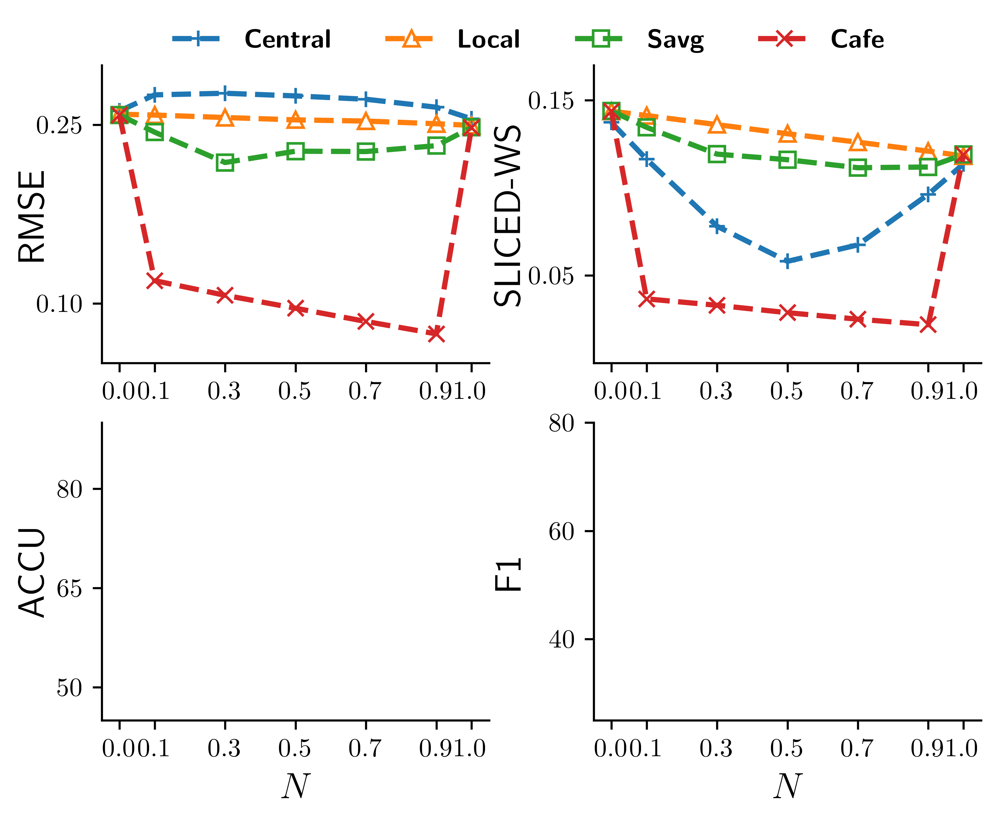

In [65]:
# scenario 2 - r = 0,0.1,0.3,0.5,0.7,0.9,1.0 vs Prediction AUROC | vs Imputation RMSE
plt.rcParams.update({'figure.dpi': '600'})
root = "M:\\OneDrive\\Projects\\federated_imputation_pc2\\results\\processed_results\\fed_imp_pc2\\0802\\codon\\result.xlsx"
data = pd.read_excel(root, sheet_name="exp2", header=0)
data = data[['mechanism', 'method', 'rmse', 'sliced-ws', 'accu', 'f1', 'roc']]

mechanism = [0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0]
method = ['central', 'local', 'simpleavg', 'fedmechw_new']
data = data[data['mechanism'].isin(mechanism)]
data = data[data['method'].isin(method)]
draw_linechart(data, x_values = mechanism, x_label = 'Ratio of Clients', metrics = ['rmse', 'sliced-ws', 'accu', 'f1'], metrics2 = None, output_name = 'line_s2')

# Convergency Plots

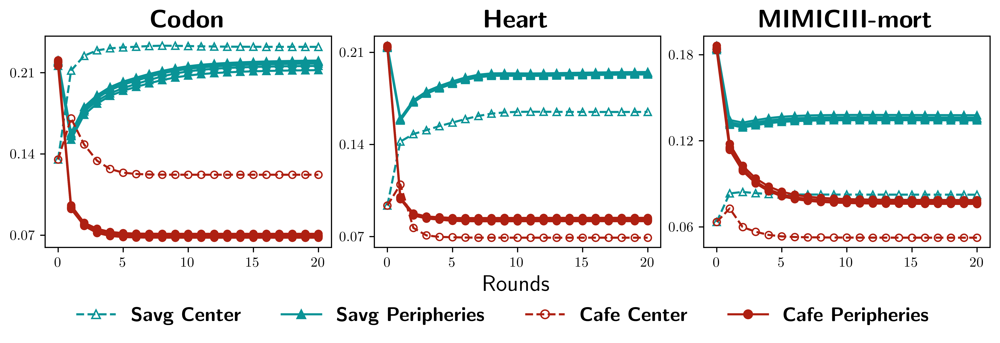

In [251]:
import matplotlib.lines as mlines
root = "M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2\\1114"
n = 9
settings = {
    r"\textbf{Codon}": root + f"\\codon\\{n}\\sample-unevenr1-600\\mnar_lr@sp=extremer1\\fixed@mr=0.5\\",
    r"\textbf{Heart}": root + f"\\heart\\{n}\\sample-unevenl1-1000\\mnar_lr@sp=extremel1\\fixed@mr=0.5\\",
    r"\textbf{MIMICIII-mort}": root + f"\\mimiciii_los\\{n}\\sample-unevenl1-1000\\mnar_lr@sp=extremel1\\fixed@mr=0.5\\",
}
methods = ['fedavg-s', 'fedmechw_new']

datas_dict = {}
for key in settings:
    datas_dict[key] = {}
    data_dir = settings[key]
    for method in methods:
        # read corresponding json file
        all_files = os.listdir(data_dir)
        ret_file = None
        for file in all_files:
            if method in file:
                ret_file = file
                break
        if ret_file is None:    
            raise ValueError("Method not found")
        
        # read json file
        with open(data_dir + ret_file + '.json') as f:
            result = json.load(f)
        
        # process result
        imp_ret = result["results"]["clients_imp_ret_clean"]["imp@rmse"]
        del imp_ret['client_avg']
        datas_dict[key][method] = np.array(list(imp_ret.values()))

#################### plot ##############################################################################
plt.rcParams['text.usetex'] = True
lw1 = '1'
ls1 = '--'
# plot params
style_dict = {
    "local": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "grey",
        "marker": "s",
        "label": r'\textbf{Local}'
    },
    "fedavg-s": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "#0A9396", #"#005F73",
        "marker": "^",
        "label": r'\textbf{Savg}'
    },
    "fedmechw_new": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "#AE2012",
        "marker": "o",
        "label": r"\textbf{Cafe}"
    },
}

label_size = 16
marker_size = 5
lw = '1.5'

plt.rcParams.update({'figure.dpi': '600'})
def conv_plots(datas_dict, mechs):
    
    fig, axes = plt.subplots(1, 3, figsize=(12, 2.7), sharey = False)
    for row_idx in range(3):
        data_dict = list(datas_dict.values())[row_idx]
        mech = mechs[row_idx]
        for method in data_dict.keys():
            # process data
            data = data_dict[method]
            c_idx = 0 if mech == 'l' else data.shape[0] - 1
            x = np.arange(data.shape[1])
            for cl_idx in range(data.shape[0]):
                ls = '--' if cl_idx == c_idx else '-'
                fillstyle = 'none' if cl_idx == c_idx else 'full'
                
                axes[row_idx].plot(
                    x, data[cl_idx], 
                    c = style_dict[method]['color'], 
                    marker = style_dict[method]['marker'], 
                    markersize = marker_size, 
                    linewidth = lw,
                    linestyle = ls,
                    fillstyle = fillstyle
                    # linestyle = style_dict[method]['line_style'], 
                    # linewidth = style_dict[method]['line_width']
                )
                
        axes[row_idx].set_title(list(datas_dict.keys())[row_idx], fontname="Computer Modern Serif", fontsize = 18)
        axes[0].set_yticks([0.07, 0.14, 0.21])
        axes[1].set_yticks([0.07, 0.14, 0.21])
        axes[2].set_yticks([0.06, 0.12, 0.18])
        axes[1].set_xlabel(r"Rounds", fontname="Computer Modern Serif", fontsize = label_size)
        #axes[0].set_ylabel(r"RMSE", fontname="Computer Modern Serif", fontsize = label_size)
        axes[row_idx].grid(False)
        
    # Create custom legends
    triangle_green_dotted = mlines.Line2D([], [], color="#0A9396", marker='^', linestyle='--', fillstyle='none', label=r'\textbf{Savg Center}')
    circle_red_dotted = mlines.Line2D([], [], color="#AE2012", marker='o', linestyle='--', fillstyle='none', label=r'\textbf{Cafe Center}')
    triangle_green_solid = mlines.Line2D([], [], color="#0A9396", marker='^', linestyle='-', label=r'\textbf{Savg Peripheries}')
    circle_red_solid = mlines.Line2D([], [], color="#AE2012", marker='o', linestyle='-', label=r'\textbf{Cafe Peripheries}')
        
    plt.legend(
        handles=[triangle_green_dotted, triangle_green_solid, circle_red_dotted, circle_red_solid], 
        loc='upper center', bbox_to_anchor=(-0.7, -0.2), ncol=4, frameon = False, prop = { "size": 14, 'weight': 'bold'})
    plt.subplots_adjust(wspace=0.15, hspace=0.0)
    plt.savefig(f'figures/conv_s1.png', dpi=600, bbox_inches="tight")
    plt.show()

conv_plots(datas_dict, mechs = ['r', 'l', 'l'])


\textbf{Codon}
\textbf{Codrna}
\textbf{MIMICIII-mort}


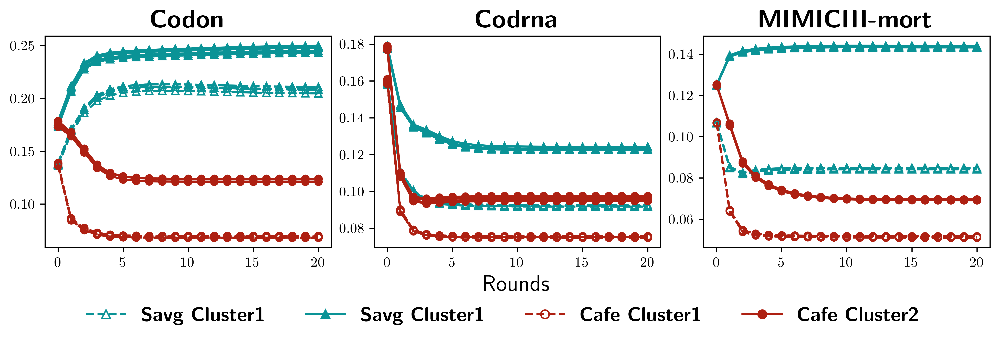

In [316]:
import matplotlib.lines as mlines
root = "M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2\\"
r = 0.5
settings = {
    r"\textbf{Codon}": root + f"0802\\codon\\10\\sample-evenly\\mnar_lr@sp=extreme_r={0.5}\\fixed@mr=0.5\\",
    r"\textbf{Codrna}": root + f"0802\\codrna\\10\\sample-evenly\\mnar_lr@sp=extreme_r={0.5}\\fixed@mr=0.5\\",
    r"\textbf{MIMICIII-mort}": root + f"s2\\mimiciii_mo2\\10\\sample-evenly\\mnar_lr@sp=extreme_r={0.5}\\fixed@mr=0.5\\",
}
methods = ['fedavg-s', 'fedmechw_new']

datas_dict = {}
for key in settings:
    print(key)
    datas_dict[key] = {}
    data_dir = settings[key]
    for method in methods:
        # read corresponding json file
        all_files = os.listdir(data_dir)
        ret_file = None
        for file in all_files:
            if method in file:
                ret_file = file
                break
        if ret_file is None:    
            raise ValueError("Method not found")
        
        # read json file
        with open(data_dir + ret_file + '.json') as f:
            result = json.load(f)
        
        # process result
        imp_ret = result["results"]["clients_imp_ret_clean"]["imp@rmse"]
        del imp_ret['client_avg']
        datas_dict[key][method] = np.array(list(imp_ret.values()))

#################### plot ##############################################################################
plt.rcParams['text.usetex'] = True
lw1 = '1'
ls1 = '--'
# plot params
style_dict = {
    "local": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "grey",
        "marker": "s",
        "label": r'\textbf{Local}'
    },
    "fedavg-s": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "#0A9396", #"#005F73",
        "marker": "^",
        "label": r'\textbf{Savg}'
    },
    "fedmechw_new": {
        "line_style": ls1,
        'line_width': lw1,
        'c_line_style': '--',
        'p_line_style': ':',
        'line_width2': '1.5',
        "color": "#AE2012",
        "marker": "o",
        "label": r"\textbf{Cafe}"
    },
}

label_size = 16
marker_size = 5
lw = '1.5'

plt.rcParams.update({'figure.dpi': '600'})
def conv_plots(datas_dict, rs):
    
    fig, axes = plt.subplots(1, 3, figsize=(12, 2.7), sharey = False)
    for row_idx in range(3):
        data_dict = list(datas_dict.values())[row_idx]
        for method in data_dict.keys():
            # process data
            data = data_dict[method]
            r = rs[row_idx]
            x = np.arange(data.shape[1])
            for cl_idx in range(data.shape[0]):
                ls = '--' if cl_idx < int(r*data.shape[0])  else '-'
                fillstyle = 'none' if cl_idx < int(r*data.shape[0])  else 'full'
                alpha = 1 if cl_idx < int(r*data.shape[0]) else 1
                
                axes[row_idx].plot(
                    x, data[cl_idx], 
                    c = style_dict[method]['color'], 
                    marker = style_dict[method]['marker'], 
                    markersize = marker_size, 
                    linewidth = lw,
                    linestyle = ls,
                    fillstyle = fillstyle,
                    alpha = alpha
                    # linestyle = style_dict[method]['line_style'], 
                    # linewidth = style_dict[method]['line_width']
                )
                
        axes[row_idx].set_title(list(datas_dict.keys())[row_idx], fontname="Computer Modern Serif", fontsize = 18)
        # axes[0].set_yticks([0.07, 0.14, 0.21])
        # axes[1].set_yticks([0.07, 0.14, 0.21])
        # axes[2].set_yticks([0.06, 0.12, 0.18])
        axes[1].set_xlabel(r"Rounds", fontname="Computer Modern Serif", fontsize = label_size)
        #axes[0].set_ylabel(r"RMSE", fontname="Computer Modern Serif", fontsize = label_size)
        axes[row_idx].grid(False)
        
    # Create custom legends
    triangle_green_dotted = mlines.Line2D([], [], color="#0A9396", marker='^', linestyle='--', fillstyle='none', label=r'\textbf{Savg Cluster1}')
    circle_red_dotted = mlines.Line2D([], [], color="#AE2012", marker='o', linestyle='--', fillstyle='none', label=r'\textbf{Cafe Cluster1}')
    triangle_green_solid = mlines.Line2D([], [], color="#0A9396", marker='^', linestyle='-', label=r'\textbf{Savg Cluster1}')
    circle_red_solid = mlines.Line2D([], [], color="#AE2012", marker='o', linestyle='-', label=r'\textbf{Cafe Cluster2}')
        
    plt.legend(
        handles=[triangle_green_dotted, triangle_green_solid, circle_red_dotted, circle_red_solid], 
        loc='upper center', bbox_to_anchor=(-0.7, -0.2), ncol=4, frameon = False, prop = { "size": 14, 'weight': 'bold'})
    plt.subplots_adjust(wspace=0.15, hspace=0.0)
    plt.savefig(f'figures/conv_s2.png', dpi=600, bbox_inches="tight")
    plt.show()

conv_plots(datas_dict, rs = [0.5, 0.5, 0.5])


# TSNE Plot

In [58]:
# pick 1 dataset pick 1 scenario 4 methods pick 2 clients - tsne plot -  

# fetch all request data
plt.rcParams.update({'figure.dpi': '100'})
root = "M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2\\0802\\codon\\11\\sample-evenly\\mnar_lr@sp=extremer1\\fixed@mr=0.5"
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
data_dict = {}

for method in methods:
    origin_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\origin_data_0.npy')
    imputed_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\imputed_data_0.npy')
    split_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\split_indices_0.npy')
    data_dict[method] = (origin_data, imputed_data, split_data)

In [59]:
from sklearn.manifold import TSNE
import gower

plt.rcParams.update({'figure.dpi': '100'})
root = "M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2\\0802\\codon\\11\\sample-evenly\\mnar_lr@sp=extremer1\\fixed@mr=0.5"
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
data_dict = {}

for method in methods:
    origin_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\origin_data_0.npy')
    imputed_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\imputed_data_0.npy')
    split_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\split_indices_0.npy')
    data_dict[method] = (origin_data, imputed_data, split_data)

# tsne plot for one client
client_indices = [0, 10]
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
method_name = ['Central', 'Local', 'SAvg', 'Ours']

######################################################################################
# tsne computing
tsne_results_dict = {}
colors_result = {}
for method in methods:
    
    origin_data = data_dict[method][0]
    imputed_data = data_dict[method][1]
    split_indices = data_dict[method][2]
    if split_indices.size == 0:
        split_indices = data_dict['local'][2]
    origin_datas = np.split(origin_data, split_indices, axis=0)
    imputed_datas = np.split(imputed_data, split_indices, axis=0)

    for client_index in client_indices:
        # data for one client
        origin_data = origin_datas[client_index]
        imputed_data = imputed_datas[client_index]
        plot_data = np.concatenate((origin_data, imputed_data), axis = 0)
        
        # Parameters
        N1 = origin_data.shape[0]
        N2 = imputed_data.shape[0]
        colors = ["red" for i in range(N1)] +  ["blue" for i in range(N2)]    

        # TSNE anlaysis
        tsne = TSNE(metric='precomputed', n_components = 2, verbose = 0, n_iter= 1000, perplexity = 40, n_iter_without_progress = 300, init = 'random')
        tsne_results = tsne.fit_transform(np.clip(gower.gower_matrix(plot_data), 0, 1))
        print('Ploting TSNE for client {} with method {} ...'.format(client_index, method))
        tsne_results_dict[(client_index, method)] = tsne_results
        colors_result[(client_index, method)] = colors

Ploting TSNE for client 0 with method central ...
Ploting TSNE for client 10 with method central ...
Ploting TSNE for client 0 with method local ...
Ploting TSNE for client 10 with method local ...
Ploting TSNE for client 0 with method fedavg-s ...
Ploting TSNE for client 10 with method fedavg-s ...
Ploting TSNE for client 0 with method fedmechw_new ...
Ploting TSNE for client 10 with method fedmechw_new ...


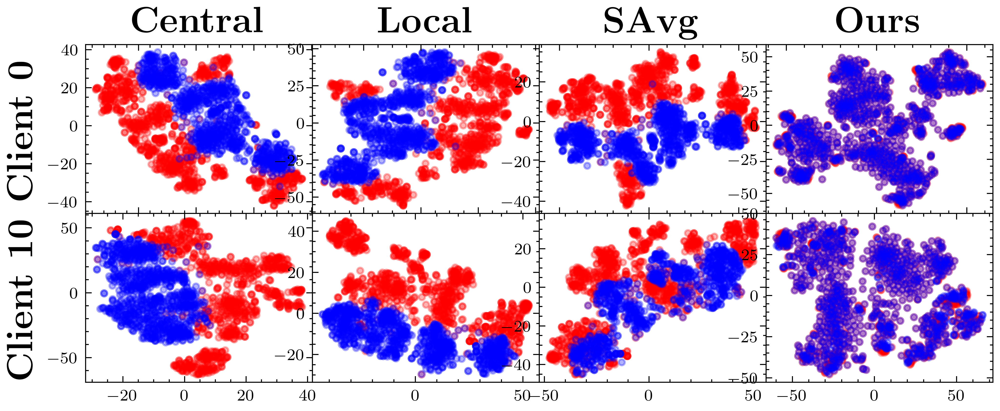

In [66]:
def to_bold_raw(string):
    string = r'\textbf{' + fr"{string}" + r'}'
    return string


def tsne_plot(tsne_results_dict, colors_result, output_name, methods, client_indices, method_name):
    
    with plt.style.context(['science', 'ieee', 'scatter']):

        fig, axes = plt.subplots(2, 4, figsize=(8, 3))

        for col_idx, method in enumerate(methods):
            
            for row_idx, client_index in enumerate(client_indices):
                
                tsne_results = tsne_results_dict[(client_index, method)]
                colors = colors_result[(client_index, method)]

                # Plotting
                axes[row_idx, col_idx].scatter(tsne_results[:N1,0], tsne_results[:N1,1], c = colors[:N1], alpha = 0.3, label = "Original")
                axes[row_idx, col_idx].scatter(tsne_results[N1:,0], tsne_results[N1:,1], c = colors[N1:], alpha = 0.3, label = "Imputed")
                #axes[row_idx, col_idx].set_title(f'{method_name[col_idx]}')
                # axes[row_idx, col_idx].set_xticklabels([])
                # axes[row_idx, col_idx].set_yticklabels([])
        
        for i in range(4):
            axes[0, i].set_title(to_bold_raw(method_name[i]), fontsize = 18, fontweight = 'black')
        
        for j in range(2):
            axes[j, 0].set_ylabel(to_bold_raw(f'Client {client_indices[j]}'), fontsize = 18, fontweight = 'black')
        
        plt.subplots_adjust(hspace=0)
        plt.subplots_adjust(wspace=0)
        fig.savefig(f'figures/{output_name}.png', dpi=600)
        plt.show()
        
output_name = 'tsne_plot_s1_11'
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
client_indices = [0, 10]
method_name = ['Central', 'Local', 'SAvg', 'Ours']
tsne_plot(tsne_results_dict, colors_result, output_name, methods, client_indices, method_name)

In [67]:
from sklearn.manifold import TSNE
import gower

plt.rcParams.update({'figure.dpi': '100'})
ratio = 0.5
root = f"M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2\\0802\\codon\\10\\sample-evenly\\mnar_lr@sp=extreme_r={ratio}\\fixed@mr=0.5"
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
data_dict = {}

for method in methods:
    origin_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\origin_data_0.npy')
    imputed_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\imputed_data_0.npy')
    split_data = np.load(root + f'\\as_{method}@s_102931466@s_50@p_False\\split_indices_0.npy')
    data_dict[method] = (origin_data, imputed_data, split_data)

# tsne plot for one client
client_indices = [0, 9]
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
method_name = ['Central', 'Local', 'SAvg', 'Ours']

######################################################################################
# tsne computing
tsne_results_dict = {}
colors_result = {}
for method in methods:
    
    origin_data = data_dict[method][0]
    imputed_data = data_dict[method][1]
    split_indices = data_dict[method][2]
    if split_indices.size == 0:
        split_indices = data_dict['local'][2]
    origin_datas = np.split(origin_data, split_indices, axis=0)
    imputed_datas = np.split(imputed_data, split_indices, axis=0)

    for client_index in client_indices:
        # data for one client
        origin_data = origin_datas[client_index]
        imputed_data = imputed_datas[client_index]
        plot_data = np.concatenate((origin_data, imputed_data), axis = 0)
        
        # Parameters
        N1 = origin_data.shape[0]
        N2 = imputed_data.shape[0]
        colors = ["red" for i in range(N1)] +  ["blue" for i in range(N2)]    

        # TSNE anlaysis
        tsne = TSNE(metric='precomputed', n_components = 2, verbose = 0, n_iter= 1000, perplexity = 40, n_iter_without_progress = 300, init = 'random')
        tsne_results = tsne.fit_transform(np.clip(gower.gower_matrix(plot_data), 0, 1))
        print('Ploting TSNE for client {} with method {} ...'.format(client_index, method))
        tsne_results_dict[(client_index, method)] = tsne_results
        colors_result[(client_index, method)] = colors

Ploting TSNE for client 0 with method central ...
Ploting TSNE for client 9 with method central ...
Ploting TSNE for client 0 with method local ...
Ploting TSNE for client 9 with method local ...
Ploting TSNE for client 0 with method fedavg-s ...
Ploting TSNE for client 9 with method fedavg-s ...
Ploting TSNE for client 0 with method fedmechw_new ...
Ploting TSNE for client 9 with method fedmechw_new ...


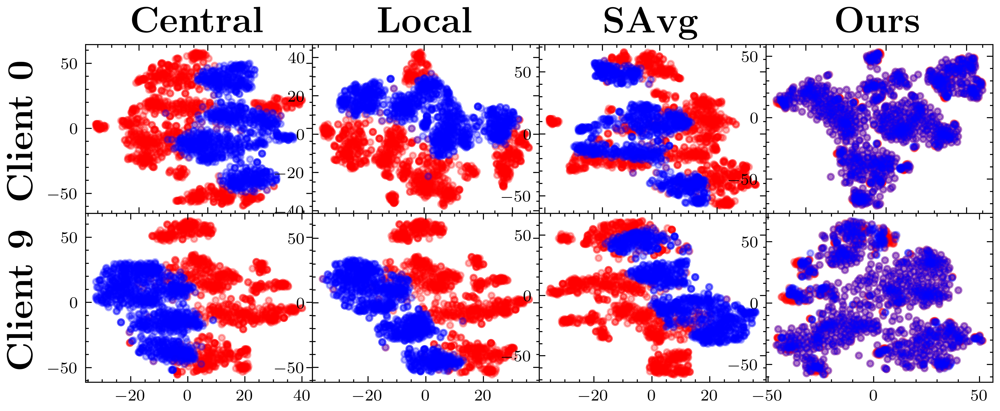

In [68]:
output_name = 'tsne_plot_s2_0.5'
methods = ['central', 'local', 'fedavg-s', 'fedmechw_new']
client_indices = [0, 9]
method_name = ['Central', 'Local', 'SAvg', 'Ours']
tsne_plot(tsne_results_dict, colors_result, output_name, methods, client_indices, method_name)

# Heatmap

In [3]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances

def vis_local_model_sim(tracker, iteration, model = 'local', metric = 'cos'):
    n_cols = 5
    n_rows = 4
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2.5))

    for feature_idx in range(n_rows * n_cols):
        clients_records = [item for item in tracker.records if item.iteration == iteration and item.feature_idx == feature_idx]
        if model == 'local':
            X = clients_records[0].local_imp_model_params
        elif model == 'mm':
            X = clients_records[0].local_mm_model_params
        # tsne = TSNE(n_components=2, verbose=0, perplexity=4, n_iter=500)
        # decomp_results = tsne.fit_transform(X)
        ax = axes[feature_idx // n_cols, feature_idx % n_cols]
        if metric == 'cos':
            cosine_sim = 1 - (cosine_similarity(X) + 1)/2
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax, vmin = 0, vmax =1)
        elif metric == 'l2':
            cosine_sim = euclidean_distances(X)
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax)
        else:
            raise NotImplementedError
        ax.title.set_text("feature {}".format(feature_idx))
    
    fig.suptitle("{}".format(model))
    plt.tight_layout()
    plt.show()

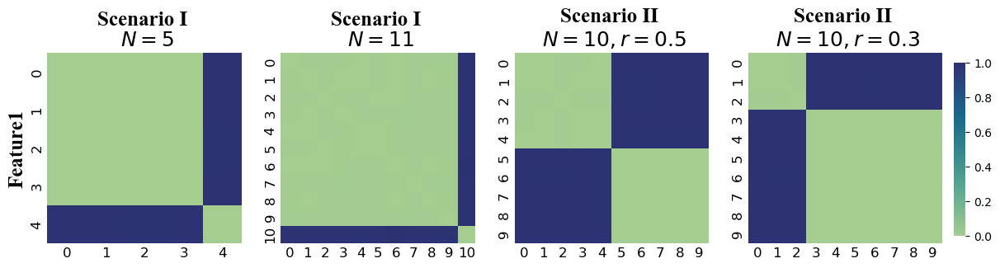

In [57]:
# settings
root = "M:\OneDrive\\Projects\\federated_imputation_pc2\\results\\raw_results\\fed_imp_pc2\\0802\\codon"

settings = [
    root + "\\5\\sample-evenly\\mnar_lr@sp=extremer1\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
    root + "\\11\\sample-evenly\\mnar_lr@sp=extremer1\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
    root + "\\10\\sample-evenly\\mnar_lr@sp=extreme_r=0.5\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
    root + "\\10\\sample-evenly\\mnar_lr@sp=extreme_r=0.3\\fixed@mr=0.5\\as_fedmechw_new@s_102931466@s_50@p_False\\mm_coef_0.npy",
]


settings_name = [
    "Scenario I \n $N = 5$",
    "Scenario I \n $N = 11$",
    "Scenario II \n $N = 10, r = 0.5$",
    "Scenario II \n $N = 10, r = 0.3$"
]


features = [1]
fig, axes = plt.subplots(1, 4, figsize=(4 * 3.5, 1 * 3), squeeze=False)

for col_idx, setting in enumerate(settings):
    for row_idx, feature in enumerate(features):
        mm_coefs = np.load(setting)
        cosine_sim = 1 - (cosine_similarity(mm_coefs[feature]) + 1)/2
        if col_idx !=3:
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = axes[row_idx, col_idx], vmin = 0, vmax =1, cbar = False, cbar_ax = None)
        else:
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = axes[row_idx, col_idx], vmin = 0, vmax =1, cbar = True, cbar_ax = fig.add_axes([.91, 0.14, .01, 0.7]))
        
        if col_idx == 0:
            axes[row_idx, col_idx].set_ylabel("Feature1", fontsize = 18, fontweight = 'black', fontname="Times New Roman")
            
        if row_idx == 0:
            axes[row_idx, col_idx].set_title(settings_name[col_idx], fontsize = 18, fontweight = 'black', fontname="Times New Roman")
            
        axes[row_idx, col_idx].tick_params(axis=u'both', which=u'both',length=0, labelsize=12)

fig.savefig(f'figures/heatmap.png', dpi=600, bbox_inches="tight")
plt.show()